# Stable Diffusion v2

**Stable Diffusion 2** is a text-to-image latent diffusion model built upon the work of Stable Diffusion 1. The project to train Stable Diffusion 2 was led by Robin Rombach and Katherine Crowson from Stability AI and LAION.

The Stable Diffusion 2.0 release includes robust text-to-image models trained using a brand new text encoder (OpenCLIP), developed by LAION with support from Stability AI, which greatly improves the quality of the generated images compared to earlier V1 releases. 

> * The text-to-image models in this release can generate images with default resolutions of both **512x512 pixels and 768x768 pixels**. 
> * These models are trained on an aesthetic subset of the LAION-5B dataset created by the DeepFloyd team at Stability AI, which is then further filtered to remove adult content using LAION’s NSFW filter.

https://pypi.org/project/diffusers/

In [1]:
#!pip install --upgrade diffusers transformers scipy

In [9]:
import cv2
import matplotlib.pyplot as plt
import os
import time
import torch
import imageio

from IPython.display import Image
from PIL import Image as PILImage

from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler, StableDiffusionUpscalePipeline

In [3]:
def image_view(imagefilename, w=12, h=12):
    """
    Display images
    """
    plt.figure(figsize=(w, h))
    plt.axis('on')
    plt.imshow(cv2.cvtColor(cv2.imread(imagefilename), cv2.COLOR_BGR2RGB))

In [4]:
IMAGES_DIR = "images"

print("Creating or using directory:", IMAGES_DIR)
os.makedirs(IMAGES_DIR, exist_ok=True)

print("Done")

Creating or using directory: images
Done


In [ ]:
!nvidia-smi

## 1. stable-diffusion-2-base (512 * 512 resolution)

In [10]:
repo_id = "stabilityai/stable-diffusion-2-base"

pipe_512 = DiffusionPipeline.from_pretrained(repo_id, torch_dtype=torch.float16, revision="fp16")
pipe_512.scheduler = DPMSolverMultistepScheduler.from_config(pipe_512.scheduler.config)
pipe_512 = pipe_512.to("cuda")

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

In [6]:
def text_2_image_base512(prompt, seedval=123456, nb_inf_steps=25):
    """
    Text to image using Stable Diffusion V2 Base
    """
    print("Text:", prompt, "\n")

    t1 = time.time()

    image = pipe_512(
        prompt,
        num_inference_steps=nb_inf_steps,  # We can change this value
        generator=torch.Generator("cuda").manual_seed(seedval)).images[0]

    output_file = IMAGES_DIR + "/" + prompt.replace(
        ',', '')[:100] + " 512x512.jpg"  # output filename
    image.save(output_file)  # Saving the image

    if len(prompt) >= 95:
        header_txt = prompt[:90] + " ..."
    else:
        header_txt = prompt

    img = cv2.imread(output_file)
    h, w, c = img.shape
    cv2.rectangle(img, (0, 0), (w, 30), (0, 0, 0), -1)
    cv2.putText(img, header_txt, (10, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.3,
                (0, 255, 0), 1, cv2.LINE_AA)

    footer_txt = "Made with Azure ML and Stable Diffusion V2"
    cv2.rectangle(img, (0, h - 22), (220, h), (0, 0, 0), -1)
    cv2.putText(img, footer_txt, (5, 501), cv2.FONT_HERSHEY_SIMPLEX, 0.3,
                (255, 255, 0), 1, cv2.LINE_AA)

    generated_image = IMAGES_DIR + '/' + prompt.replace(
        ',', '')[:100] + ' with prompt 512x512.jpg'
    cv2.imwrite(generated_image, img, [int(cv2.IMWRITE_JPEG_QUALITY), 100])

    print("Image saved:", generated_image, "\nImage size: with =", w,
          " height =", h)
    print("\nDone in", round(time.time() - t1), "seconds")

    return generated_image

### Text

In [7]:
prompts = [
    "a watercolour of a beautiful sea landscape from Normandy, rainy day, detailed, intricate, artstation, vibrant",
    "a beautiful orchid flower in a bottle of glasses, red color vibe, ultra detailed, light from top",
    "a painting of some people walking in the street, in a snowy day, by Emile Friant",
    "a digital illustration of a steampunk flying machine in space\
 with cogs and mechanisms and eagles, 4k, detailed, trending in artstation, fantasy vivid colors",
    "a portrait of a group of children in the street by Jean-Michel Basquiat, high detail,\
 sharp focus, 4k",
    "Cute and adorable rat wizard, wearing coat and suit, steampunk, lantern, anthromorphic,\
 steampunk, vivid colors",
    "new cartoon character of Clint Eastwood, highly detailed, extremely high quality,\
 hd, professional photographer, lifelike, top – rated, award winning, cinematic, realistic,\
 detailed lighting, detailed shadows, sharp, no blur, edited, corrected, trending",
    "Iron Maiden album cover, Eddie, guitar, city streets, night atmostphere, 4k",
    "A high tech home utopia in the Amazon rainforest",
    "Paris cyberpunk attacked by aliens, Eiffel tower, with explosions, realistic, high definition,\
 many details, dramatic scene",
    "a armchair in the shape of a tomato in a modern living room",
    "a funky movie adaptation of the scream of munch by walt disney, elegant, cartoony",
]

In [8]:
for idx in range(len(prompts)):
    print("Prompt", idx + 1, ":", prompts[idx])

Prompt 1 : a watercolour of a beautiful sea landscape from Normandy, rainy day, detailed, intricate, artstation, vibrant
Prompt 2 : a beautiful orchid flower in a bottle of glasses, red color vibe, ultra detailed, light from top
Prompt 3 : a painting of some people walking in the street, in a snowy day, by Emile Friant
Prompt 4 : a digital illustration of a steampunk flying machine in space with cogs and mechanisms and eagles, 4k, detailed, trending in artstation, fantasy vivid colors
Prompt 5 : a portrait of a group of children in the street by Jean-Michel Basquiat, high detail, sharp focus, 4k
Prompt 6 : Cute and adorable rat wizard, wearing coat and suit, steampunk, lantern, anthromorphic, steampunk, vivid colors
Prompt 7 : new cartoon character of Clint Eastwood, highly detailed, extremely high quality, hd, professional photographer, lifelike, top – rated, award winning, cinematic, realistic, detailed lighting, detailed shadows, sharp, no blur, edited, corrected, trending
Prompt 8 

### Testing

Text: a watercolour of a beautiful sea landscape from Normandy, rainy day, detailed, intricate, artstation, vibrant 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/a watercolour of a beautiful sea landscape from Normandy rainy day detailed intricate artstation vib with prompt 512x512.jpg 
Image size: with = 512  height = 512

Done in 44 seconds


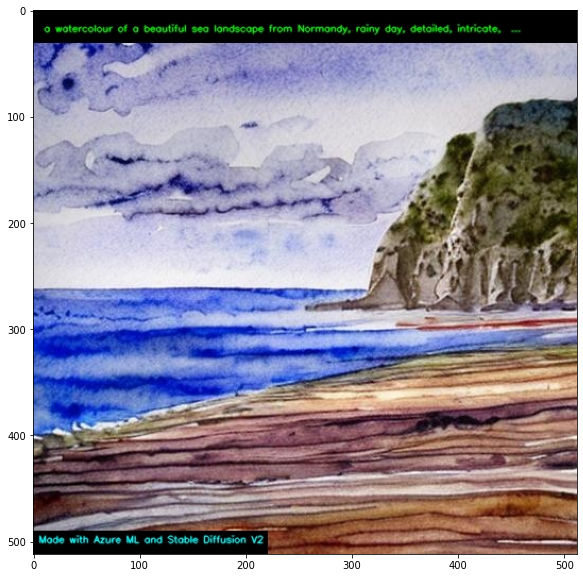

In [11]:
img = text_2_image_base512(prompts[0], seedval=12345)
image_view(img, w=10, h=10)

Text: a beautiful orchid flower in a bottle of glasses, red color vibe, ultra detailed, light from top 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/a beautiful orchid flower in a bottle of glasses red color vibe ultra detailed light from top with prompt 512x512.jpg 
Image size: with = 512  height = 512

Done in 43 seconds


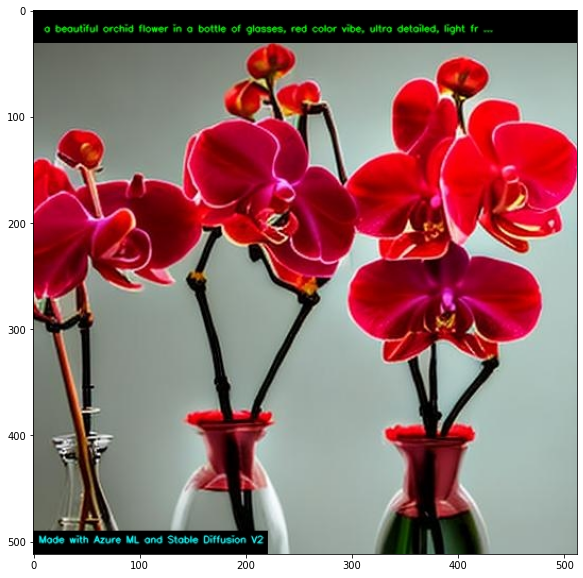

In [12]:
img = text_2_image_base512(prompts[1], seedval=1245)
image_view(img, w=10, h=10)

Text: a painting of some people walking in the street, in a snowy day, by Emile Friant 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/a painting of some people walking in the street in a snowy day by Emile Friant with prompt 512x512.jpg 
Image size: with = 512  height = 512

Done in 43 seconds


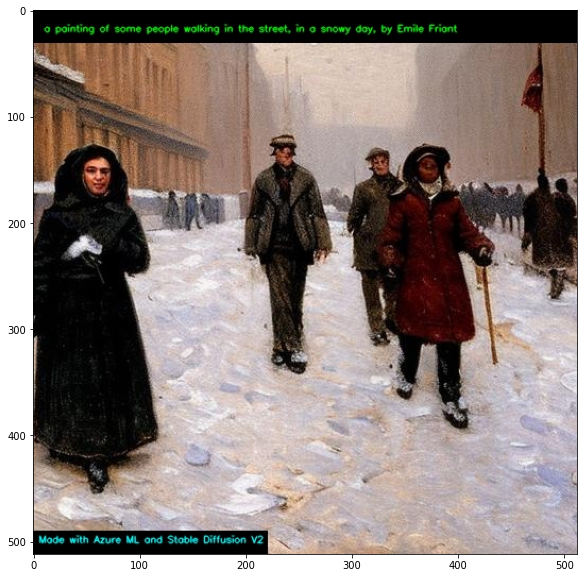

In [13]:
img = text_2_image_base512(prompts[2], seedval=123456)
image_view(img, w=10, h=10)

## 2. stable-diffusion-2  (768 * 768 resolution)

In [14]:
repo_id = "stabilityai/stable-diffusion-2"

pipe_768 = DiffusionPipeline.from_pretrained(repo_id,
                                             torch_dtype=torch.float16,
                                             revision="fp16")
pipe_768.scheduler = DPMSolverMultistepScheduler.from_config(
    pipe_768.scheduler.config)
pipe_768 = pipe_768.to("cuda")

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

In [15]:
def text_2_image_768(prompt, seedval=123456, nb_inf_steps=25):
    """
    Text to image using Stable Diffusion V2 with 768 x 768 resolution
    """
    print("Text:", prompt, "\n")

    t1 = time.time()

    image = pipe_768(
        prompt,
        num_inference_steps=nb_inf_steps,
        generator=torch.Generator("cuda").manual_seed(seedval),
    ).images[0]

    output_file = IMAGES_DIR + "/" + prompt.replace(',',
                                                    '')[:100] + " 768x768.jpg"
    image.save(output_file)

    if len(prompt) >= 95:
        header_txt = prompt[:90] + " ..."
    else:
        header_txt = prompt

    img = cv2.imread(output_file)
    h, w, c = img.shape
    cv2.rectangle(img, (0, 0), (w, 30), (0, 0, 0), -1)
    cv2.putText(img, header_txt, (10, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.3,
                (0, 255, 0), 1, cv2.LINE_AA)

    footer_txt = "Made with Azure ML and Stable Diffusion V2"
    cv2.rectangle(img, (0, h - 30), (220, w), (0, 0, 0), -1)
    cv2.putText(img, footer_txt, (5, h - 15), cv2.FONT_HERSHEY_SIMPLEX, 0.3,
                (255, 255, 0), 1, cv2.LINE_AA)

    generated_image = IMAGES_DIR + '/' + prompt.replace(
        ',', '')[:100] + " with prompt 768x768.jpg"
    cv2.imwrite(generated_image, img, [int(cv2.IMWRITE_JPEG_QUALITY), 100])
    
    print("Image saved:", generated_image, "\nImage size: with =", w,
          " height =", h)
    print("\nDone in", round(time.time() - t1), "seconds")

    return generated_image

### Testing

Text: a watercolour of a beautiful sea landscape from Normandy, rainy day, detailed, intricate, artstation, vibrant 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/a watercolour of a beautiful sea landscape from Normandy rainy day detailed intricate artstation vib with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 106 seconds


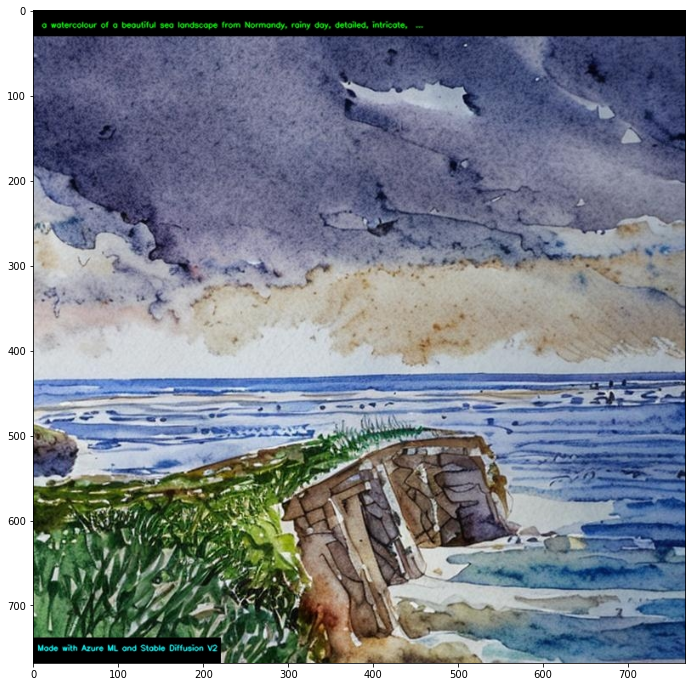

In [16]:
img = text_2_image_768(prompts[0], seedval=123456)
image_view(img)

Text: a beautiful orchid flower in a bottle of glasses, red color vibe, ultra detailed, light from top 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/a beautiful orchid flower in a bottle of glasses red color vibe ultra detailed light from top with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 106 seconds


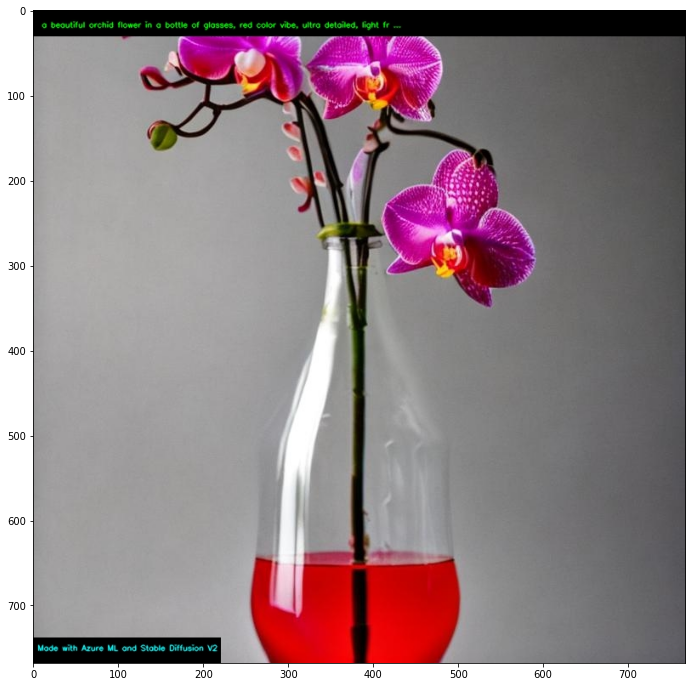

In [17]:
img = text_2_image_768(prompts[1], seedval=1245)
image_view(img)

Text: a painting of some people walking in the street, in a snowy day, by Emile Friant 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/a painting of some people walking in the street in a snowy day by Emile Friant with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 107 seconds


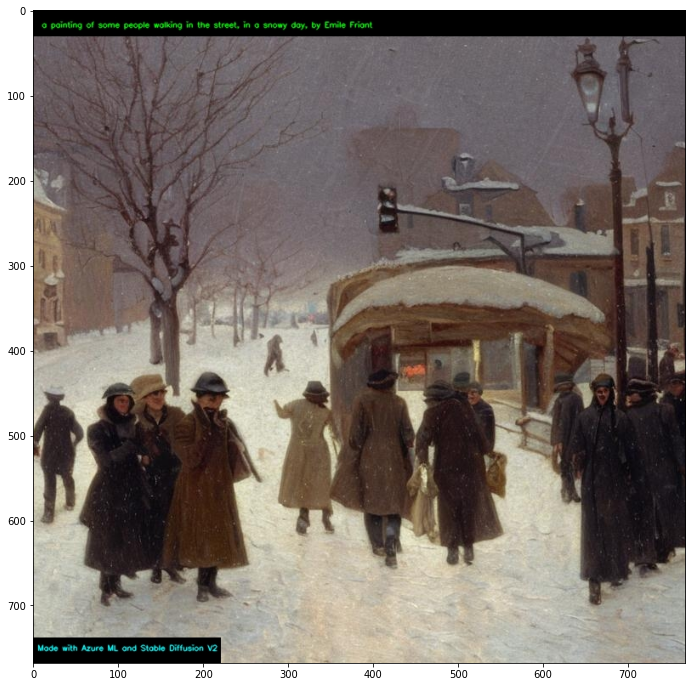

In [18]:
img = text_2_image_768(prompts[2], seedval=123456)
image_view(img)

Text: a digital illustration of a steampunk flying machine in space with cogs and mechanisms and eagles, 4k, detailed, trending in artstation, fantasy vivid colors 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/a digital illustration of a steampunk flying machine in space with cogs and mechanisms and eagles 4k with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 108 seconds


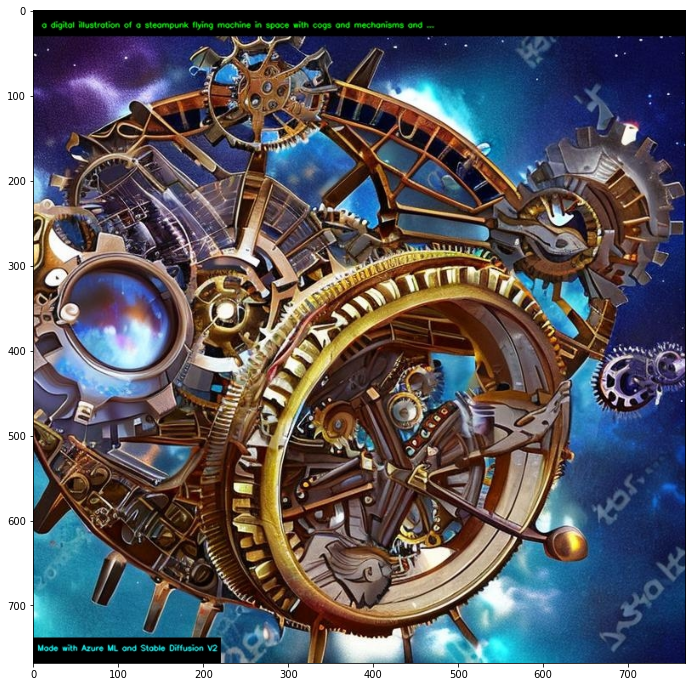

In [19]:
img = text_2_image_768(prompts[3], seedval=123456)
image_view(img)

Text: a portrait of a group of children in the street by Jean-Michel Basquiat, high detail, sharp focus, 4k 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/a portrait of a group of children in the street by Jean-Michel Basquiat high detail sharp focus 4k with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 108 seconds


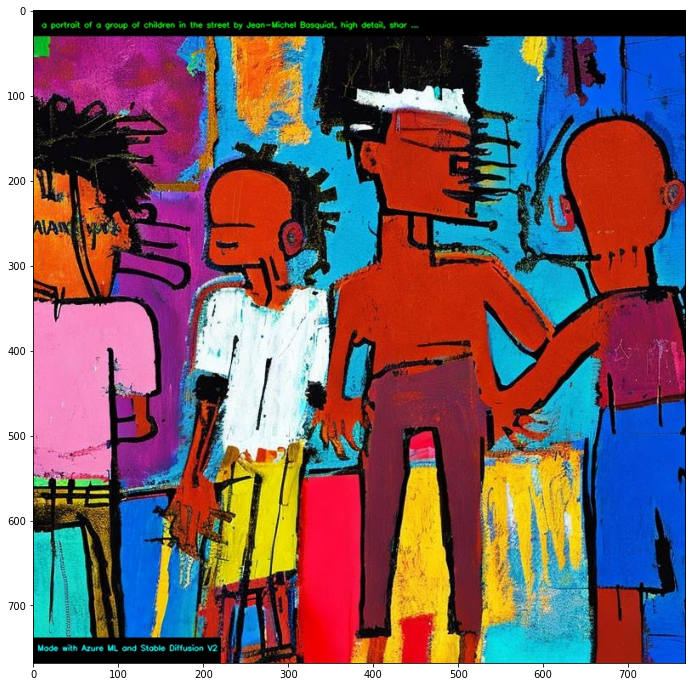

In [20]:
img = text_2_image_768(prompts[4], seedval=123456)
image_view(img)

Text: Cute and adorable rat wizard, wearing coat and suit, steampunk, lantern, anthromorphic, steampunk, vivid colors 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/Cute and adorable rat wizard wearing coat and suit steampunk lantern anthromorphic steampunk vivid c with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 108 seconds


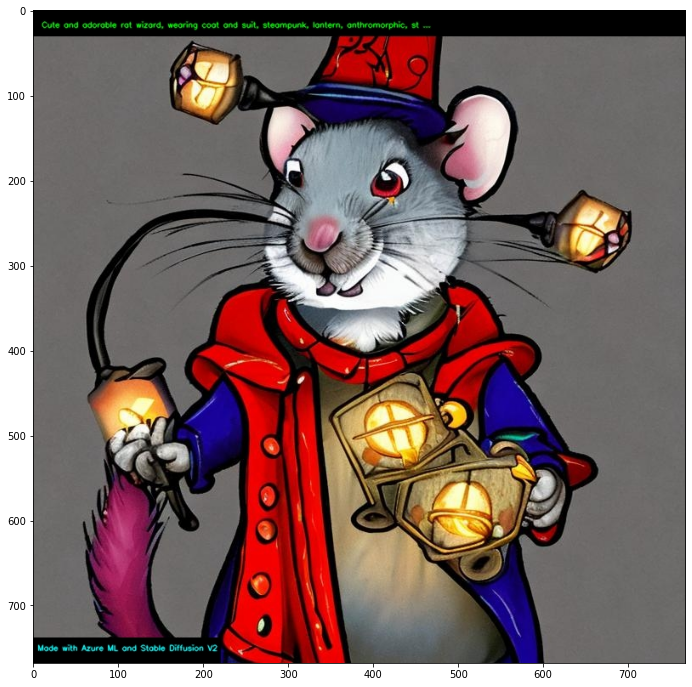

In [21]:
img = text_2_image_768(prompts[5], seedval=12345)
image_view(img)

Text: new cartoon character of Clint Eastwood, highly detailed, extremely high quality, hd, professional photographer, lifelike, top – rated, award winning, cinematic, realistic, detailed lighting, detailed shadows, sharp, no blur, edited, corrected, trending 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/new cartoon character of Clint Eastwood highly detailed extremely high quality hd professional photo with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 108 seconds


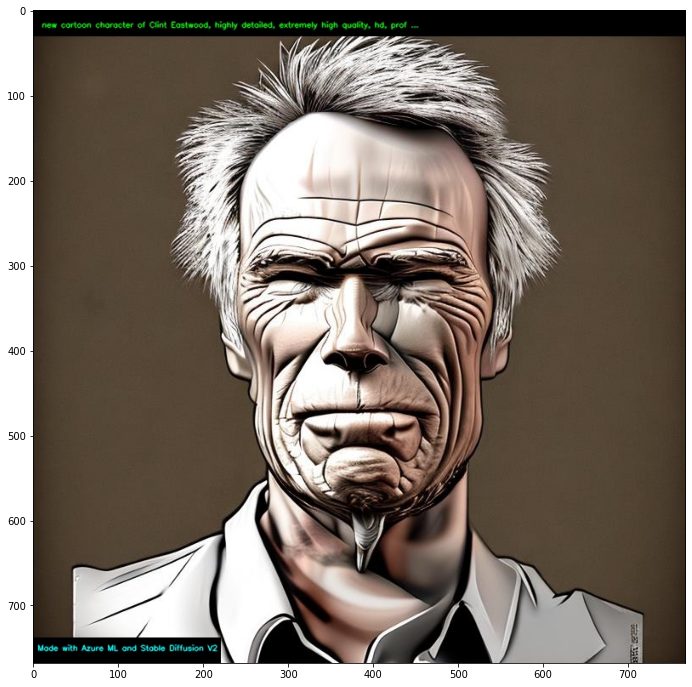

In [22]:
img = text_2_image_768(prompts[6], seedval=1234657)
image_view(img)

Text: Iron Maiden album cover, Eddie, guitar, city streets, night atmostphere, 4k 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/Iron Maiden album cover Eddie guitar city streets night atmostphere 4k with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 108 seconds


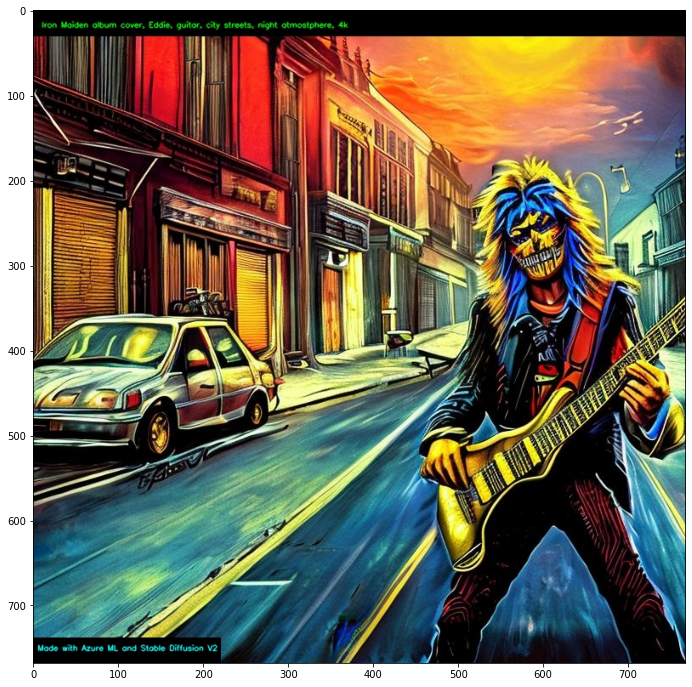

In [23]:
img = text_2_image_768(prompts[7], seedval=654321)
image_view(img)

Text: A high tech home utopia in the Amazon rainforest 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/A high tech home utopia in the Amazon rainforest with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 109 seconds


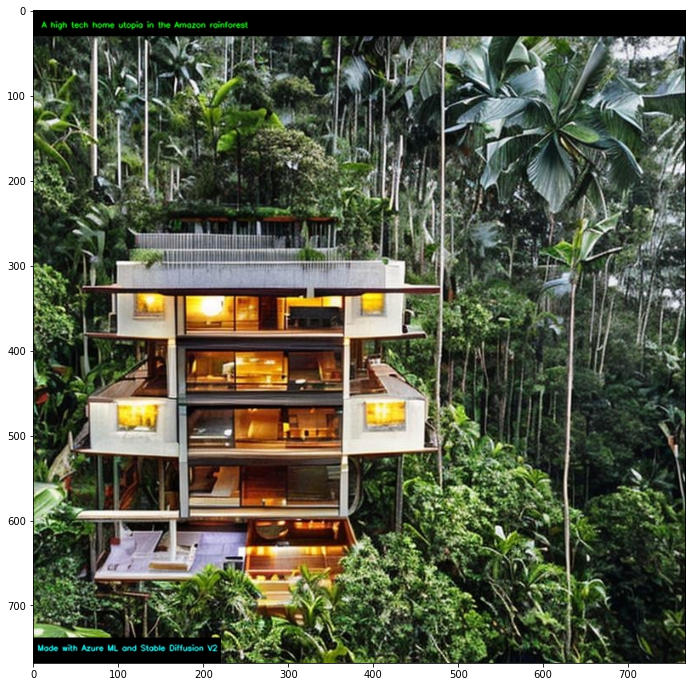

In [24]:
img = text_2_image_768(prompts[8], seedval=12345)
image_view(img)

Text: Paris cyberpunk attacked by aliens, Eiffel tower, with explosions, realistic, high definition, many details, dramatic scene 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/Paris cyberpunk attacked by aliens Eiffel tower with explosions realistic high definition many detai with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 109 seconds


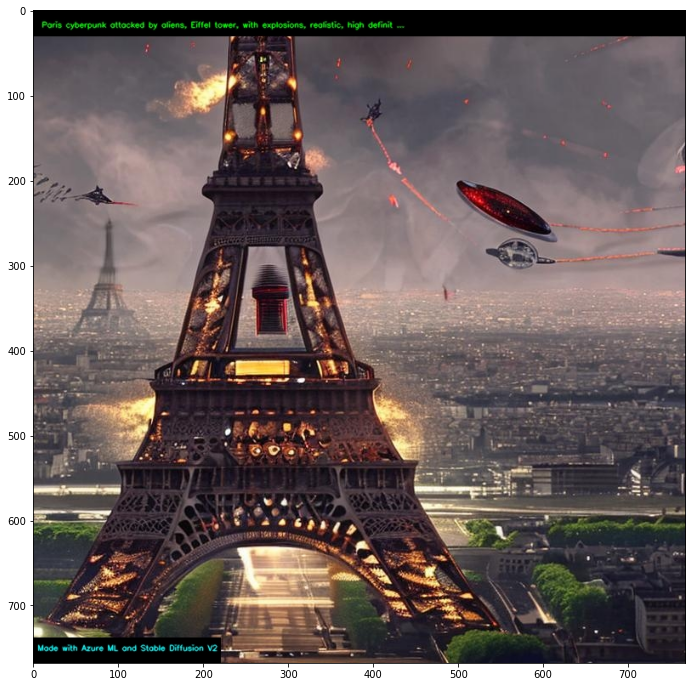

In [25]:
img = text_2_image_768(prompts[9], seedval=12345)
image_view(img)

Text: a armchair in the shape of a tomato in a modern living room 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/a armchair in the shape of a tomato in a modern living room with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 109 seconds


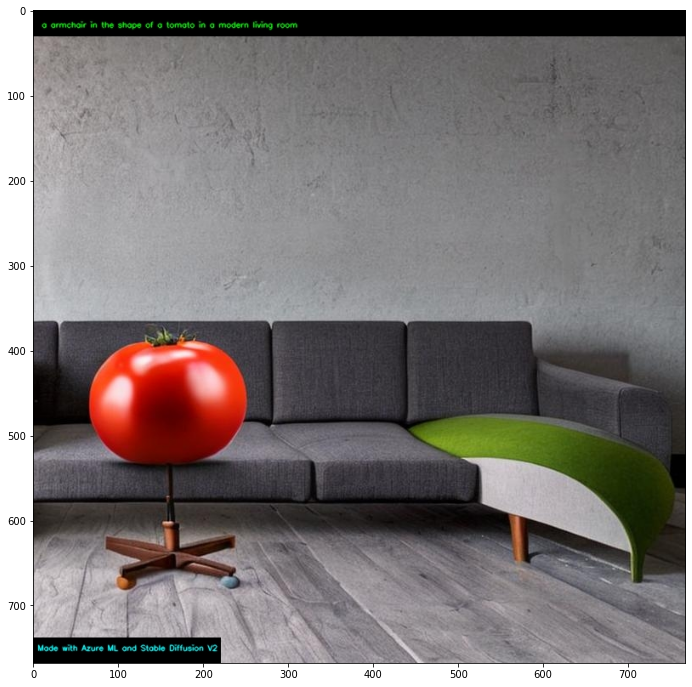

In [26]:
img = text_2_image_768(prompts[10], seedval=1234985)
image_view(img)

Text: a funky movie adaptation of the scream of munch by walt disney, elegant, cartoony 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/a funky movie adaptation of the scream of munch by walt disney elegant cartoony with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 109 seconds


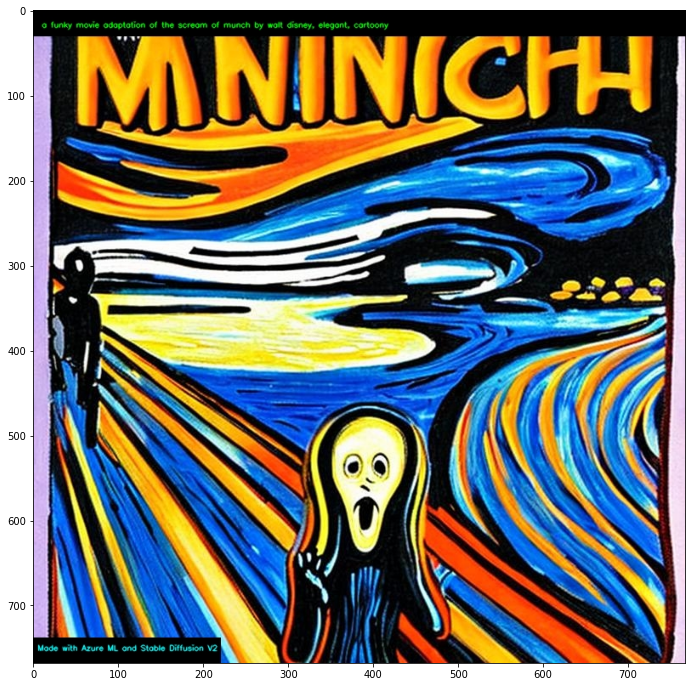

In [27]:
img = text_2_image_768(prompts[11], seedval=1234567)
image_view(img)

## 3. Let's use some prompts proposed by chatGPT

https://chat.openai.com/chat

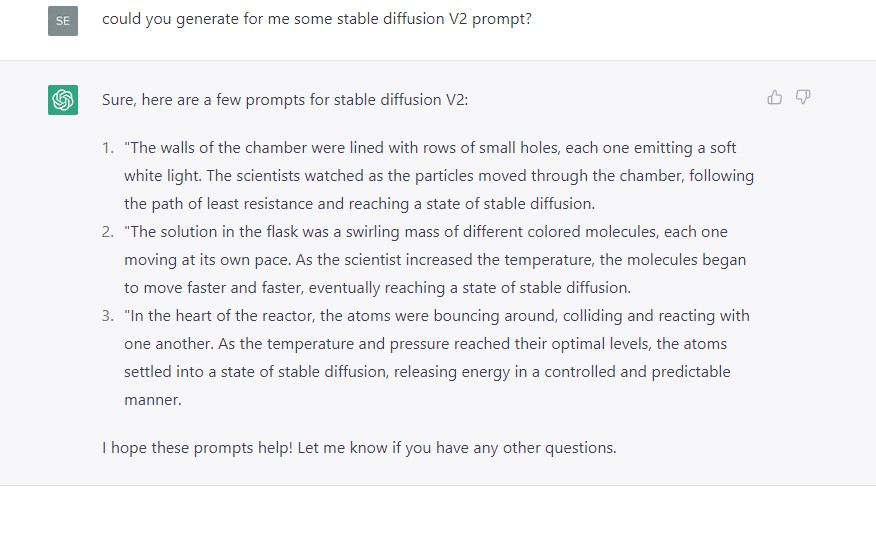

In [28]:
Image(filename="chatGPT.jpg")

In [31]:
chatGPT_prompt1 = "The walls of the chamber were lined with rows of small holes, each one emitting a soft white light.\
 The scientists watched as the particles moved through the chamber, following the path of least resistance\
 and reaching a state of stable diffusion."

chatGPT_prompt2 = "The solution in the flask was a swirling mass of different colored molecules, each one moving at\
 its own pace. As the scientist increased the temperature, the molecules began to move faster and faster,\
 eventually reaching a state of stable diffusion."

chatGPT_prompt3 = "In the heart of the reactor, the atoms were bouncing around, colliding and reacting with one another.\
As the temperature and pressure reached their optimal levels, the atoms settled into a state of stable diffusion,\
 releasing energy in a controlled and predictable manner."

chatGPT_prompt4 = "The leaves of the tree rustled in the wind as the sun shone down, warming the air and\
 causing the molecules of water vapor to rise and diffuse through the air."

Text: The walls of the chamber were lined with rows of small holes, each one emitting a soft white light. The scientists watched as the particles moved through the chamber, following the path of least resistance and reaching a state of stable diffusion. 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/The walls of the chamber were lined with rows of small holes each one emitting a soft white light. T with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 107 seconds


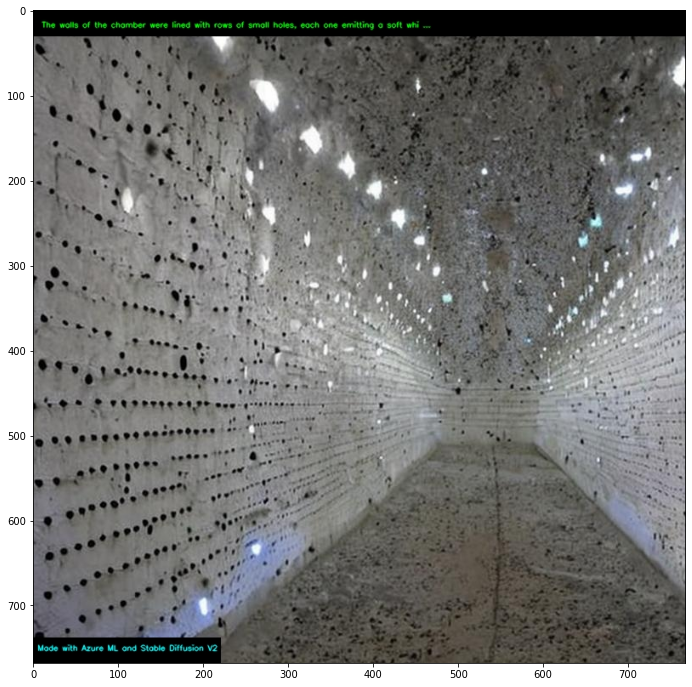

In [33]:
img = text_2_image_768(chatGPT_prompt1, seedval=1234567)
image_view(img)

Text: The solution in the flask was a swirling mass of different colored molecules, each one moving at its own pace. As the scientist increased the temperature, the molecules began to move faster and faster, eventually reaching a state of stable diffusion. 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/The solution in the flask was a swirling mass of different colored molecules each one moving at its  with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 107 seconds


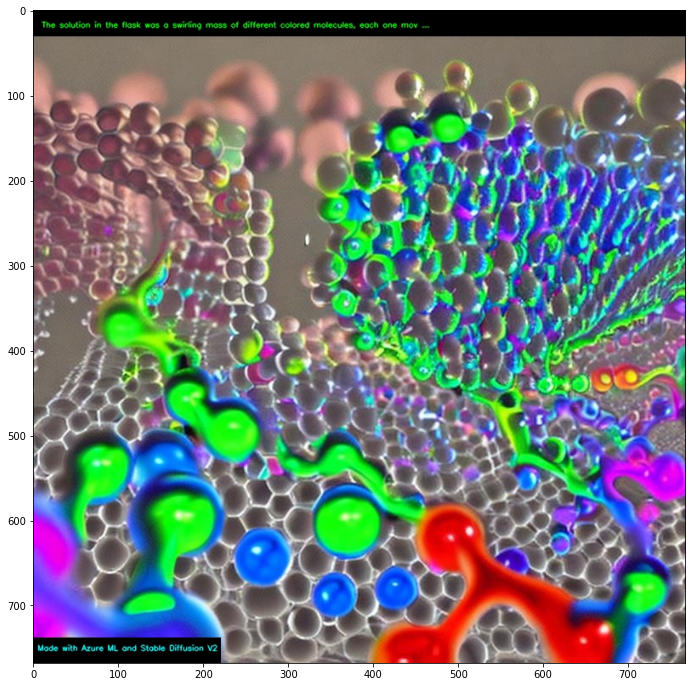

In [35]:
img = text_2_image_768(chatGPT_prompt2, seedval=1234567)
image_view(img)

Text: In the heart of the reactor, the atoms were bouncing around, colliding and reacting with one another.As the temperature and pressure reached their optimal levels, the atoms settled into a state of stable diffusion, releasing energy in a controlled and predictable manner. 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/In the heart of the reactor the atoms were bouncing around colliding and reacting with one another.A with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 107 seconds


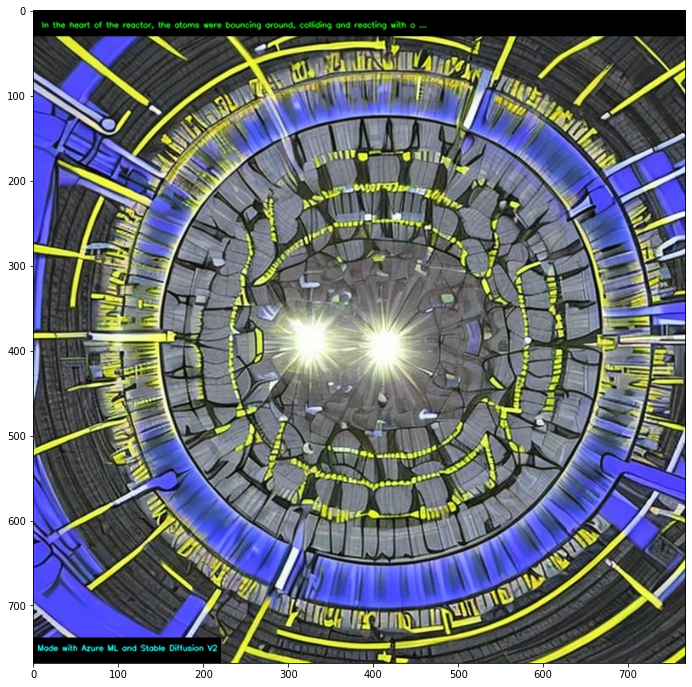

In [36]:
img = text_2_image_768(chatGPT_prompt3, seedval=1234567)
image_view(img)

Text: The leaves of the tree rustled in the wind as the sun shone down, warming the air and causing the molecules of water vapor to rise and diffuse through the air. 



  0%|          | 0/25 [00:00<?, ?it/s]

Image saved: images/The leaves of the tree rustled in the wind as the sun shone down warming the air and causing the mol with prompt 768x768.jpg 
Image size: with = 768  height = 768

Done in 108 seconds


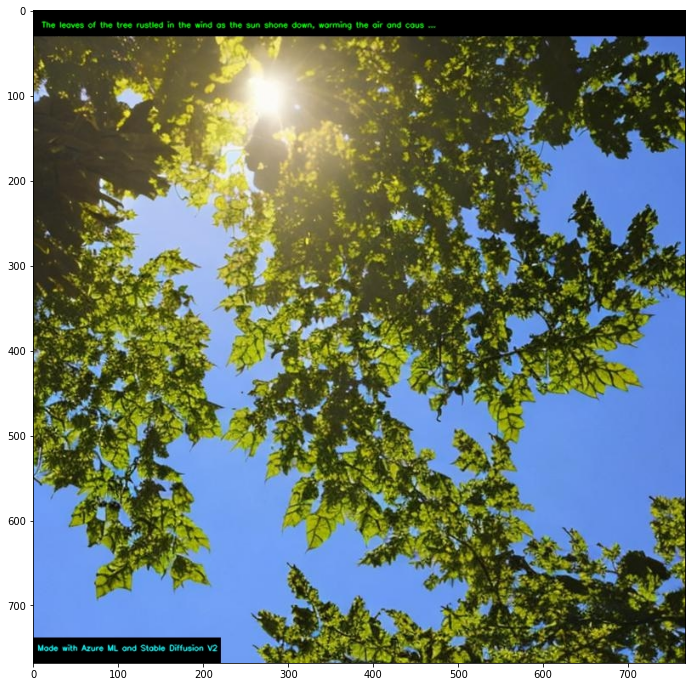

In [37]:
img = text_2_image_768(chatGPT_prompt4, seedval=1234567)
image_view(img)

## 4. All 768 * 768 generated images into a gif file

In [50]:
gif_file = "stable_diffusion_v2_examples.gif"
duration_sec = 2.5
fps = 30
images_list = []

images_files = [
    file for file in os.listdir(IMAGES_DIR)
    if file.endswith("jpg") and file.find("with prompt 768x768") != -1
]

print(len(images_files), "images will been saved into", gif_file, "\n")

for imagefile in images_files:
    images_list.append(imageio.imread(IMAGES_DIR + '/' + imagefile))
    imageio.mimsave(gif_file, images_list, duration = duration_sec, fps = fps)

print("Done")

16 images will been saved into stable_diffusion_v2_examples.gif 

Done


In [51]:
!ls *.gif -lh

-rwxrwxrwx 1 root root 6.2M Dec 13 14:09 stable_diffusion_v2_examples.gif
